In [2]:
!git clone https://github.com/ultralytics/yolov5.git


Cloning into 'yolov5'...
remote: Enumerating objects: 16413, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 16413 (delta 0), reused 3 (delta 0), pack-reused 16408
Receiving objects: 100% (16413/16413), 14.90 MiB | 8.29 MiB/s, done.
Resolving deltas: 100% (11265/11265), done.


In [3]:
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow


/kaggle/working/yolov5
Note: you may need to restart the kernel to use updated packages.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab 4.0.11 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
jupyterlab-lsp 5.0.2 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
libpysal 4.9.2 requires packaging>=22, but you have packaging 21.3 which is incompatible.
libpysal 4.9.2 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
momepy 0.7.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
osmnx 1.8.1 requires shapely>=2.0, but you have shapely 1.8.5.post1 which is incompatible.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
tensorflowjs 4.16.0 requires packaging~=23.1, but you have packaging 21

In [4]:
import torch
import os
from IPython.display import Image, clear_output

In [5]:
torch.cuda.get_device_properties(0)

_CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)

In [6]:
!pip install roboflow

In [7]:

from roboflow import Roboflow
rf = Roboflow(api_key="bH4YbQQnwva1tbhWNjtX")
project = rf.workspace("sant-anna").project("fabric-defectv4")
dataset = project.version(2).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to fabric-defectv4-2 in yolov5pytorch:: 100%|██████████| 2208/2208 [00:00<00:00, 5834.23it/s]


In [8]:
os.environ["DATASET_DIRECTORY"] = "/content/yolov5/fabric-defectv4-2"

In [9]:
!python train.py --batch 8 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-02-15 15:34:55.591736: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-15 15:34:55.591843: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-15 15:34:55.721167: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train:

In [13]:
%load_ext tensorboard
%tensorboard --logdir runs


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 25046), started 0:06:06 ago. (Use '!kill 25046' to kill it.)

In [11]:
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/kaggle/working/yolov5/fabric-defectv4-2/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
WARNING ⚠️ invalid check_version(None, >=3.3) requested, please check values.
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7045186 parameters, 0 gradients, 15.9 GFLOPs
image 1/42 /kaggle/working/yolov5/fabric-defectv4-2/test/images/20231127_144506_out0003holesstain_jpg.rf.8c1debc1bfd852f8e9f02fb51883f9f6.jpg: 640x640 6 stains, 2 tiny-holes, 11.6ms
image 2/42 /kaggle/working/yolov5/fabric-de

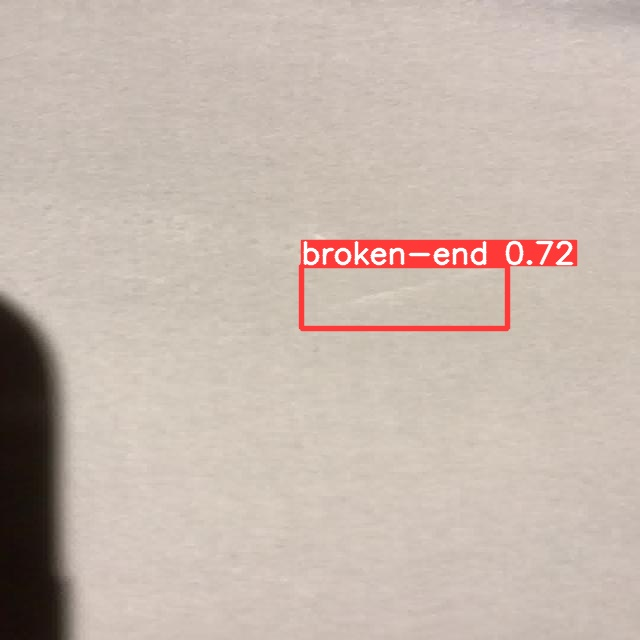

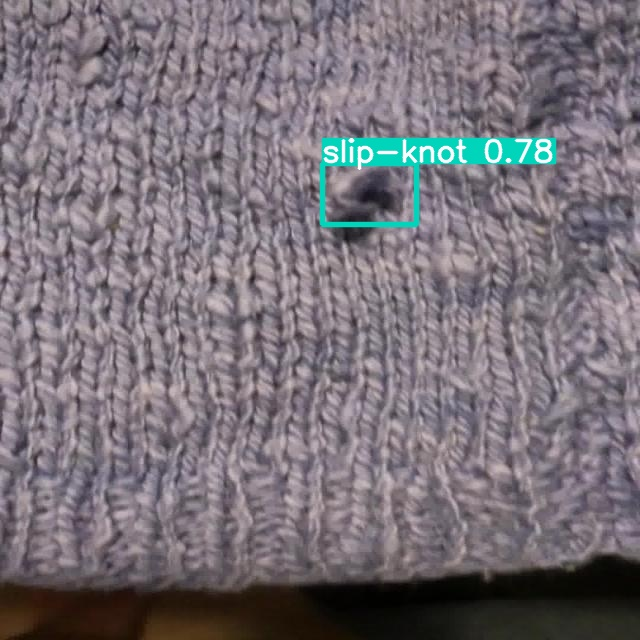

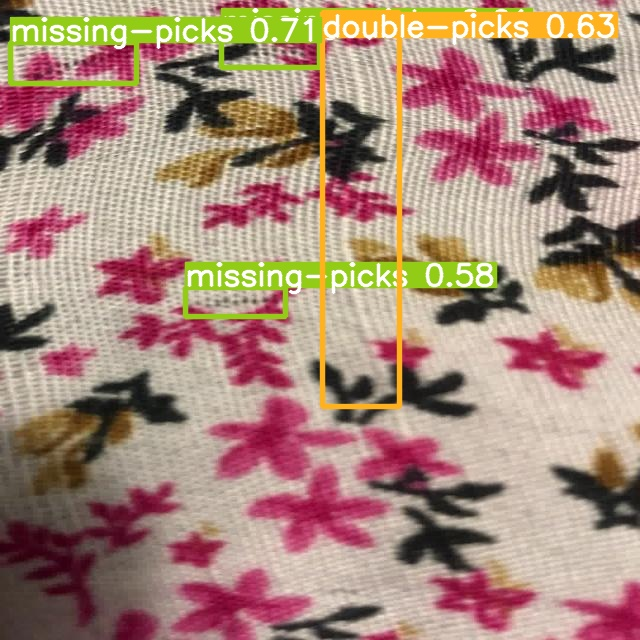

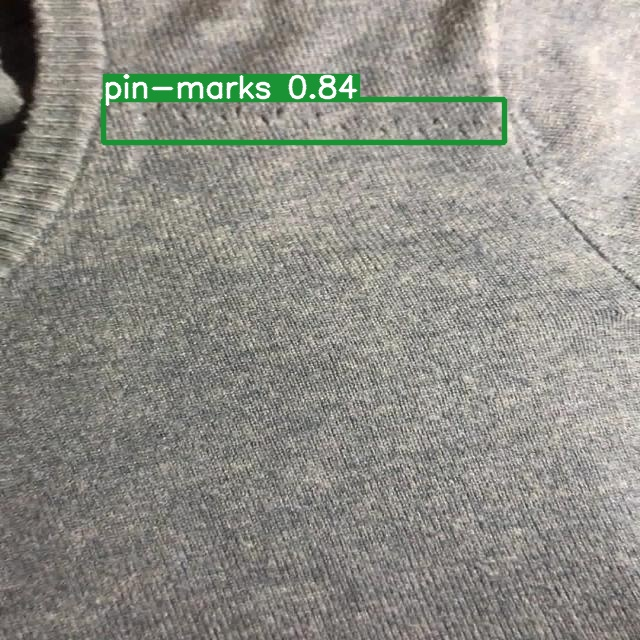

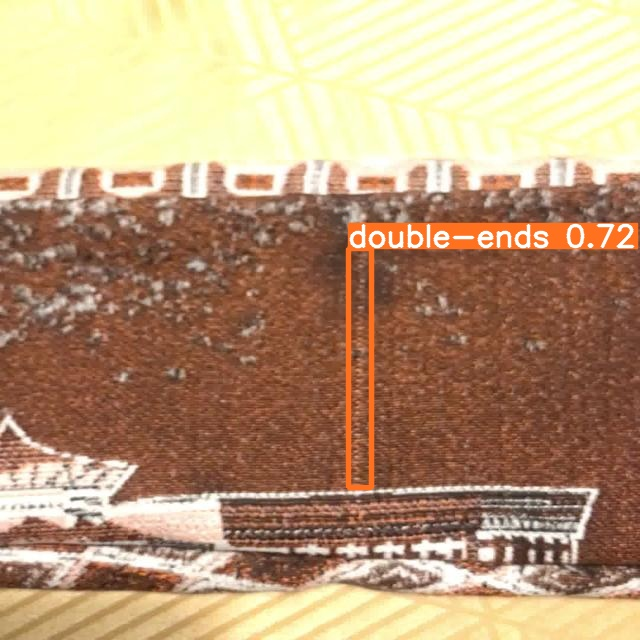

...

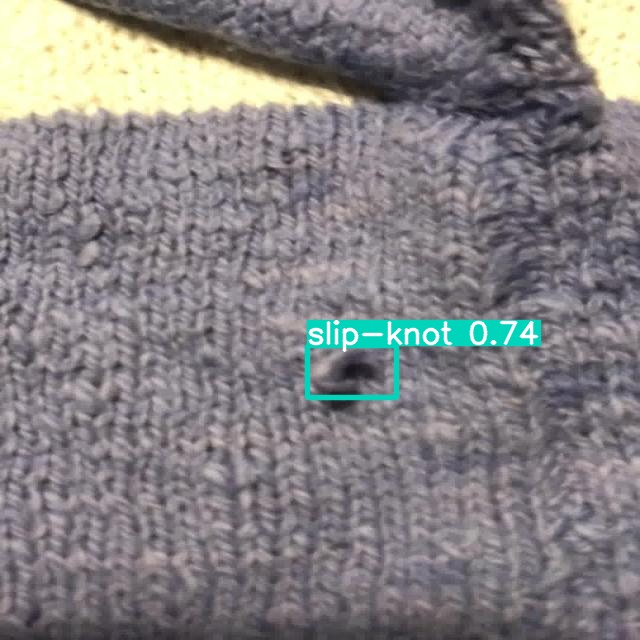

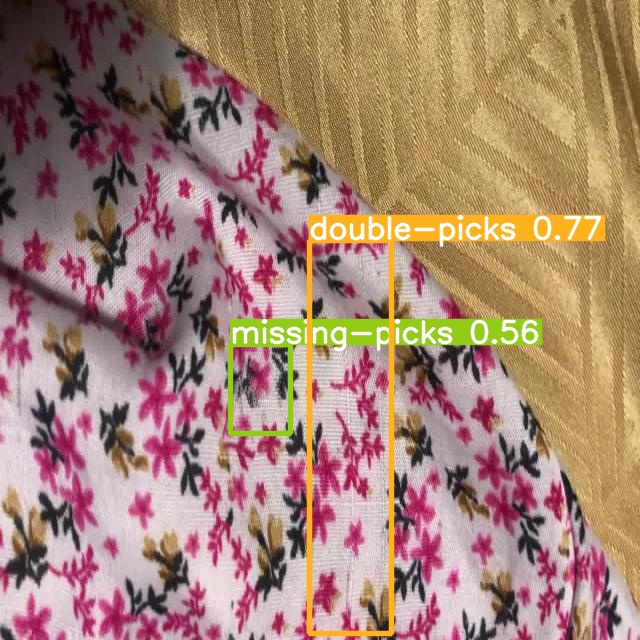

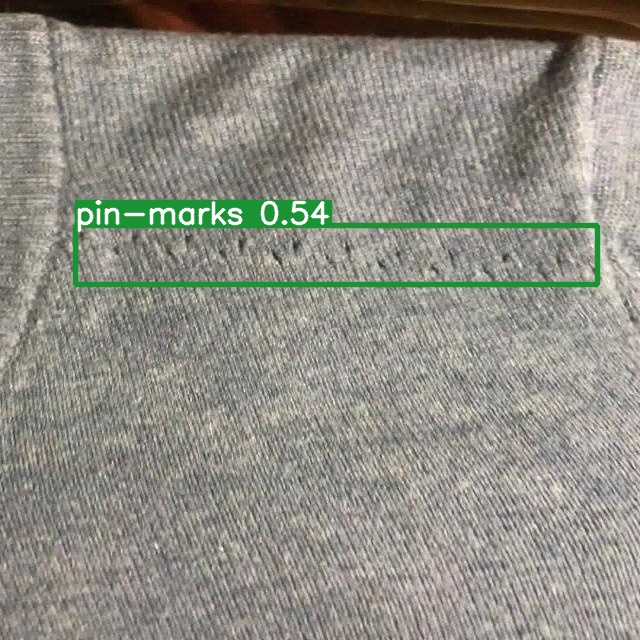

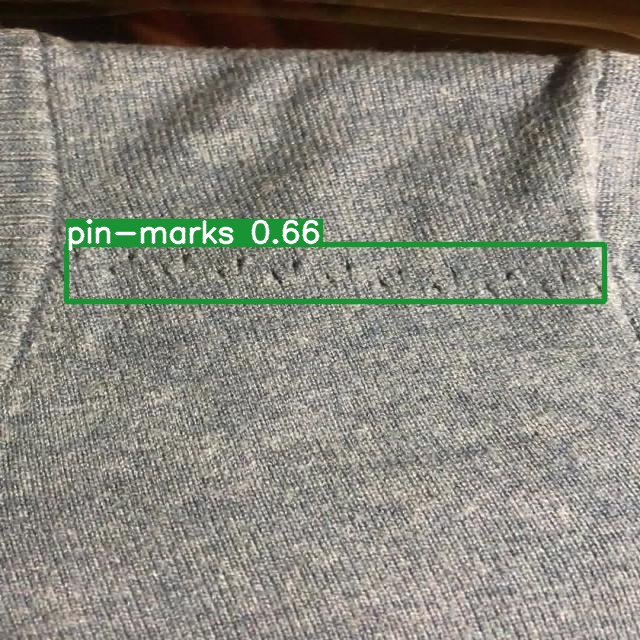

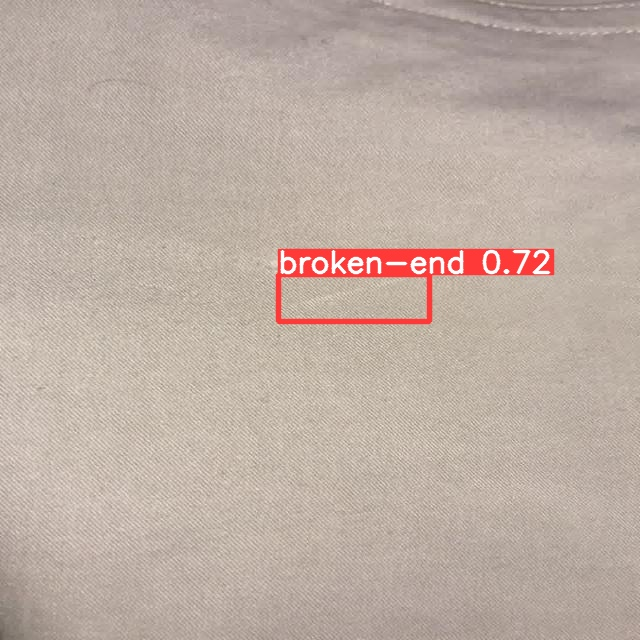

In [14]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/kaggle/working/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## Testing

In [16]:
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.1 --source /kaggle/input/fabric

detect: weights=['runs/train/exp/weights/best.pt'], source=/kaggle/input/fabric, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
WARNING ⚠️ invalid check_version(None, >=3.3) requested, please check values.
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7045186 parameters, 0 gradients, 15.9 GFLOPs
image 1/9 /kaggle/input/fabric/Fabric1.jpg: 640x640 (no detections), 11.6ms
image 2/9 /kaggle/input/fabric/Fabric2.jpg: 640x640 (no detections), 11.6ms
image 3/9 /kaggle/input/fabric/Fabric3.jpg: 640x640 (no detections), 11.6ms
image 4/9 /kaggle/input/fabri

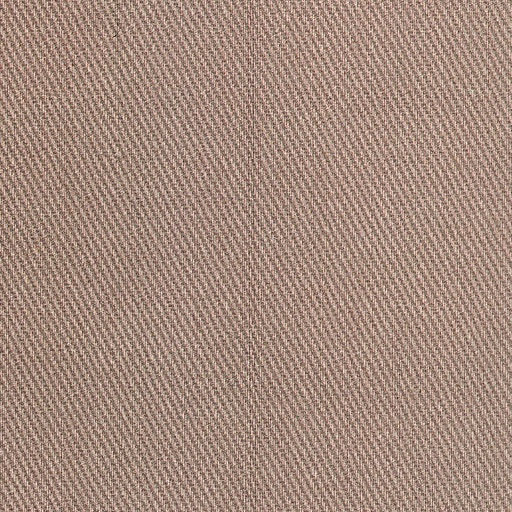

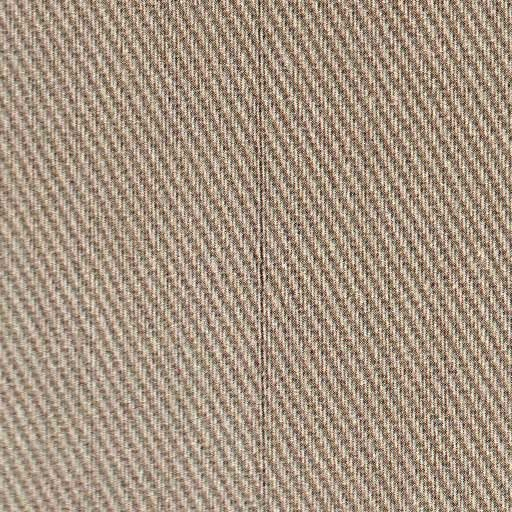

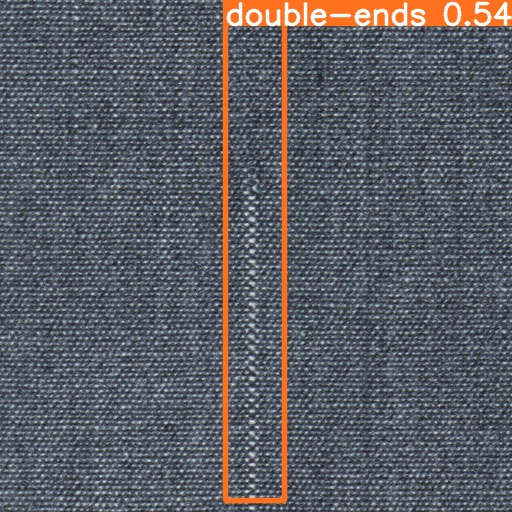

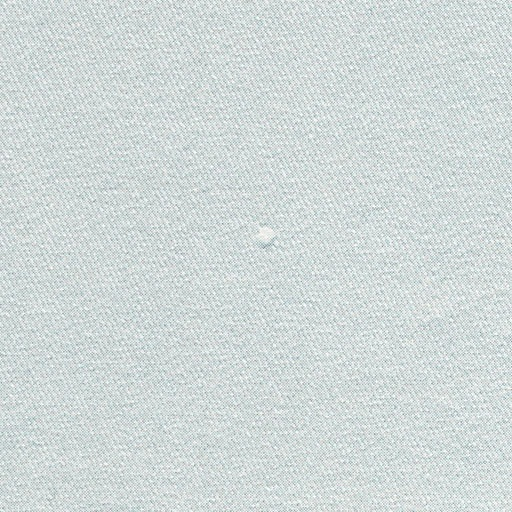

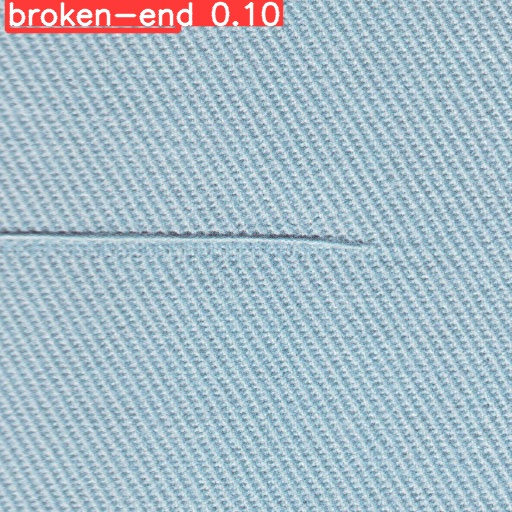

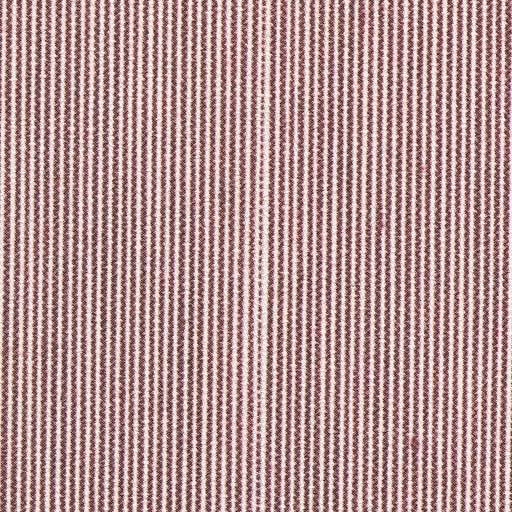

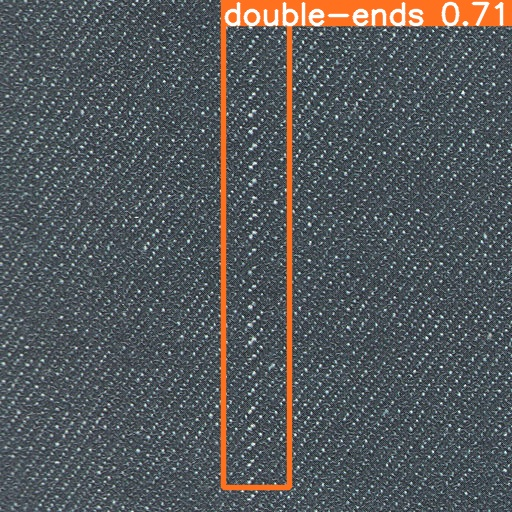

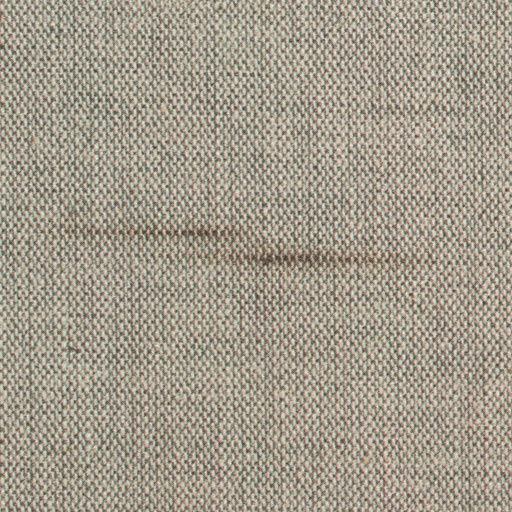

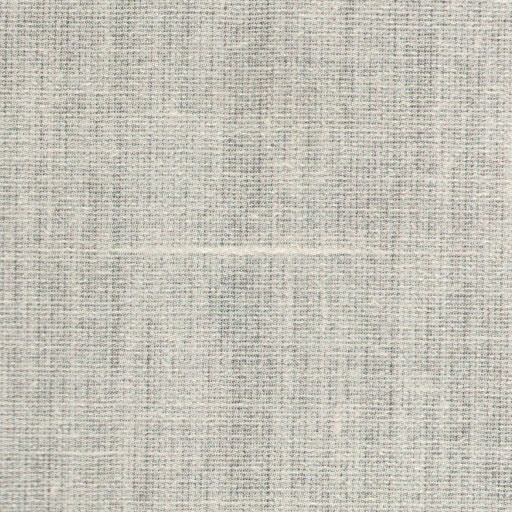

In [17]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/kaggle/working/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [21]:
torch.cuda.is_available()

True

In [32]:
import torch

model = torch.hub.load('ultralytics/yolov5', 'custom','/kaggle/working/yolov5/runs/train/exp/weights/best.pt')


WARNING ⚠️ invalid check_version(None, >=3.3) requested, please check values.


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7045186 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


image 1/1: 512x512 1 double-ends
Speed: 13.1ms pre-process, 7.8ms inference, 5.3ms NMS per image at shape (1, 3, 640, 640)


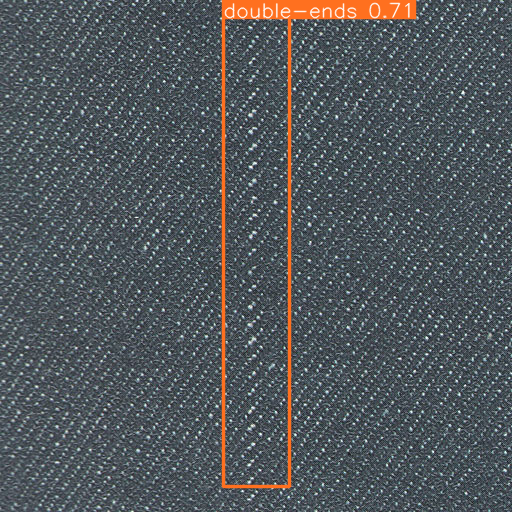

In [33]:
from PIL import Image

# Images
img = Image.open('/kaggle/input/fabric/Fabric9.jpg') 

# Inference
result = model(img, size=640)  # includes NMS
result.print()
result.show()

In [45]:
torch.save('/kaggle/working/yolov5/runs/train/exp/weights/best.pt','/kaggle/working/Fabic_Defect_Detection_.pt')

In [39]:
import torch
from PIL import Image
weight_path='/kaggle/working/yolov5/runs/train/exp/weights/best.pt'
def check_defect(image_path):
    #Loading model
    model = torch.hub.load('ultralytics/yolov5', 'custom',weight_path)
    img = Image.open('/kaggle/input/fabric/Fabric9.jpg') 
    result = model(img, size=640)  
    result.print()
    result.show()
    

WARNING ⚠️ invalid check_version(None, >=3.3) requested, please check values.


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7045186 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 
image 1/1: 512x512 1 double-ends
Speed: 10.7ms pre-process, 6.5ms inference, 6.4ms NMS per image at shape (1, 3, 640, 640)


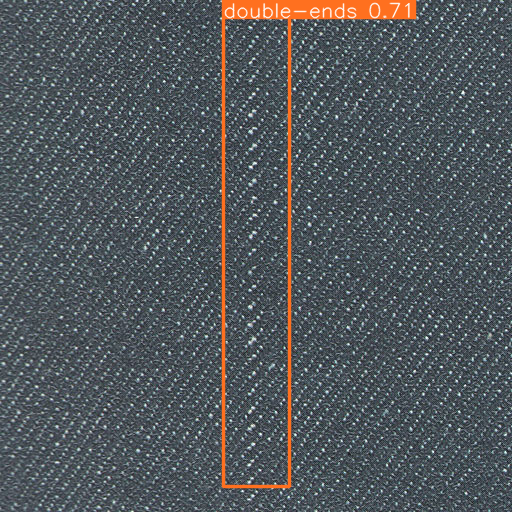

In [40]:
check_defect("/kaggle/input/fabric/Fabric9.jpg")

WARNING ⚠️ invalid check_version(None, >=3.3) requested, please check values.


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7045186 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 
image 1/1: 883x1110 (no detections)
Speed: 10.6ms pre-process, 66.1ms inference, 0.6ms NMS per image at shape (1, 3, 512, 640)


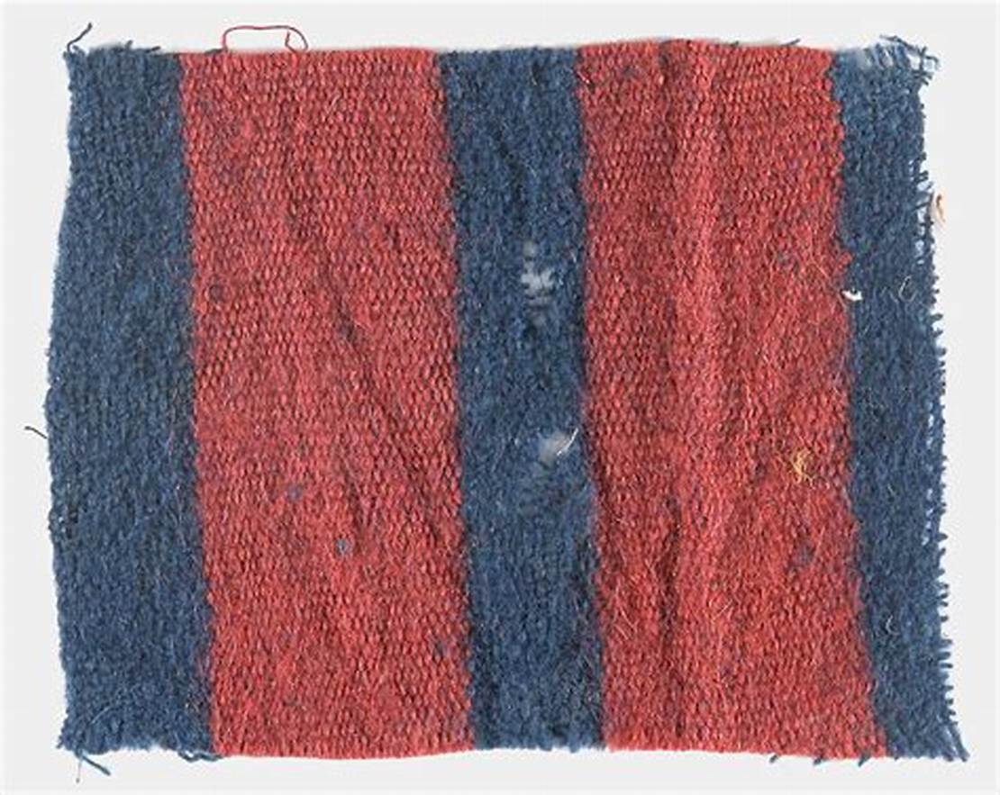

In [52]:
import requests
from io import BytesIO

image_url = "https://th.bing.com/th/id/OIP.q1jd3nkoo2U9JAONoNK06gHaF5?w=1110&h=883&rs=1&pid=ImgDetMain"

response = requests.get(image_url)

if response.status_code == 200:
    image_data = response.content
    image = Image.open(BytesIO(image_data))
    model = torch.hub.load('ultralytics/yolov5', 'custom',weight_path)
    result = model(image, size=640)  
    result.print()
    result.show()
    
else:
    print("Failed to fetch the image. Status code:", response.status_code)